In [3]:
%run common.ipy

datawarehouse version is not version 1.1.9, upgrading
Verifying collectors
Verifying:   0%|                                          | 0/8 [00:00<?, ?it/s]Won't run daostack/daos-mainnet
Traceback (most recent call last):
  File "/home/davo/Documents/GRASIA/daostack-notebooks/.direnv/python-3.11/lib/python3.11/site-packages/dao_analyzer/cache_scripts/common/common.py", line 207, in _verifyCollectors
    if c.verify():
       ^^^^^^^^^^
  File "/home/davo/Documents/GRASIA/daostack-notebooks/.direnv/python-3.11/lib/python3.11/site-packages/dao_analyzer/cache_scripts/common/graphql.py", line 118, in verify
    self.query()
  File "/home/davo/Documents/GRASIA/daostack-notebooks/.direnv/python-3.11/lib/python3.11/site-packages/dao_analyzer/cache_scripts/daostack/runner.py", line 61, in query
    ds = self.schema
         ^^^^^^^^^^^
  File "/home/davo/Documents/GRASIA/daostack-notebooks/.direnv/python-3.11/lib/python3.11/site-packages/dao_analyzer/cache_scripts/common/graphql.py", line 79, 

In [4]:
# Data tools
import pandas as pd
import numpy as np
import scipy
import scipy.signal

# Visualization
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

sns.set_theme()

# Jupyter
from IPython.display import display, HTML, Image
import ipywidgets as widgets
from tqdm.autonotebook import tqdm
tqdm.pandas()

# Local modules
import utils
print("Default registered only:", utils.DEFAULT_REGISTERED_ONLY)

# Some global configs
pd.set_option('display.max_columns', 30)
# plt.style.use('dark_background')

/tmp/ipykernel_232603/317881580.py:19: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Default registered only: True


In [5]:
dfp = utils.get_df('dfp')
datecols = ['proposer', 'stage'] + [ x for x in dfp.columns if x.endswith('At') ]
dfp[datecols]

proposer  \
network id                                                                                              
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f...  0xbaaea72417f4dc3e0f52a1783b0913d0f3516634   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...  0x052c68abe8e4bf0b78925e488b98f6fdc18a3af9   
        0x003c109411e96e5607ce609278536262e12afdaa65ab...  0xb33b9fba681653fe263b31a95766d83d18c2128d   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a...  0x86fd6dd41bad636b5b3b9228bc5642fa0df392e8   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4...  0x7cb9032844e722bef2e16a761832c59c96550898   
...                                                                                               ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...  0x478f1a09bc1477148a91508b9320274dce563605   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946...  0x91628ddc3a6ff9b48a2f34fc315d243eb07a9501   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3...  0x06044b5359d8df7886366c22c61c7ecd29becac7   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a...  0x8e900cf9bd655e34bb610f0ef365d8d476fd7337   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989...  0xa601aed34dda12ff760d8abb64fd4eb3664e35af   

                                                              stage  \
network id                                                            
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f...  Executed   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...  Executed   
        0x003c109411e96e5607ce609278536262e12afdaa65ab...  Executed   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a...  Executed   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4...  Executed   
...                                                             ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...  Executed   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946...  Executed   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3...  Executed   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a...  Executed   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989...  Executed   

                                                                    createdAt  \
network id                                                                      
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f... 2019-10-22 10:07:58   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd... 2020-01-17 19:07:19   
        0x003c109411e96e5607ce609278536262e12afdaa65ab... 2020-03-14 17:52:32   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a... 2019-12-14 14:52:54   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4... 2019-11-01 19:26:29   
...                                                                       ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873... 2020-02-15 22:45:00   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946... 2021-06-04 03:27:55   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3... 2020-02-11 13:36:25   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a... 2022-02-08 09:23:30   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989... 2021-01-22 19:09:15   

                                                                 preBoostedAt  \
network id                                                                      
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f... 2019-10-22 10:39:28   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...                 NaT   
        0x003c109411e96e5607ce609278536262e12afdaa65ab... 2020-03-14 19:53:49   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a... 2019-12-14 18:13:24   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4... 2019-11-01 19:34:07   
...                                                                       ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...                 NaT   
        0xff32174f3f

## ¿Cual es el tamaño de la cola de propuestas en la red?

Una propuesta puede estar en los siguientes estados:
- Executed: La propuesta ha sido aceptada o denegada.
- Expired in queue: La propuesta ha sido denegada porque no fue boosteada ni consiguió una mayoría absoluta
- Boosted: Esperando. Si tras la espera, hay mayoría relativa, se acepta la propuesta
- Queued: En la cola a la espera de ser boosteada o llegar a mayoría absoluta
- PreBoosted: Ha sido boosteada pero debe hacerse una llamada para que pase a ser boosted o algo así

- [ ] Mirar bien lo de preboosted, hay propuestas preboosted que nunca llegaron a ser boosteadas

**El tamaño de la cola aumenta** en +1:
- cada vez que una propuesta es creada (createdAt)

**El tamaño de la cola disminuye**:
- cuando una propuesta es boosteada (boostedAt)
- cuando una propuesta no boosteada es ejecutada
- cuando una propuesta "expira" en la cola

> Objetivo: Crear un dataframe de "eventos" con **índice datetime** y las siguientes columnas:
> - **network**: la red 
> - **id**: el id de la propuesta
> - **event**: el tipo de evento (categorical) -> queued / unqueued

In [6]:
dfq = utils.get_df('dfq')
dfq

queued  \
network id                                                                      
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f... 2019-10-22 10:07:58   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd... 2020-01-17 19:07:19   
        0x003c109411e96e5607ce609278536262e12afdaa65ab... 2020-03-14 17:52:32   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a... 2019-12-14 14:52:54   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4... 2019-11-01 19:26:29   
...                                                                       ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873... 2020-02-15 22:45:00   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946... 2021-06-04 03:27:55   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3... 2020-02-11 13:36:25   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a... 2022-02-08 09:23:30   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989... 2021-01-22 19:09:15   

                                                                     unqueued  \
network id                                                                      
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f... 2019-10-23 12:44:17   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd... 2020-01-17 19:39:16   
        0x003c109411e96e5607ce609278536262e12afdaa65ab... 2020-03-15 19:54:03   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a... 2019-12-15 21:57:46   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4... 2019-11-03 07:48:08   
...                                                                       ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873... 2020-02-16 01:19:10   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946... 2021-06-11 00:01:15   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3... 2020-02-11 13:37:30   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a... 2022-02-09 10:51:15   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989... 2021-01-23 21:10:55   

                                                               reason  \
network id                                                              
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f...   boostedAt   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...  executedAt   
        0x003c109411e96e5607ce609278536262e12afdaa65ab...   boostedAt   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a...   boostedAt   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4...   boostedAt   
...                                                               ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...  executedAt   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946...   boostedAt   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3...  executedAt   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a...   boostedAt   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989...   boostedAt   

                                                                                                  dao  \
network id                                                                                              
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f...  0x294f999356ed03347c7a23bcbcf8d33fa41dc830   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...  0x39757e7cdb7022c3829195d57b29428d79593c9d   
        0x003c109411e96e5607ce609278536262e12afdaa65ab...  0x519b70055af55a007110b4ff99b0ea33071c720a   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a...  0x8990e11b69403ea53ef2b32434bbd7dbf84b5234   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4...  0x440583455bcd85ab2bd429c015d3aabcae135f0a   
...                                                                                               ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...  0x4bdf38ec4528691025bfcf9fca66ed1ccca4034b   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946...  0xe716ec6

In [7]:
dfq.describe()

,delta
count,3967
mean,7 days 14:38:21.366019662
std,19 days 11:24:46.519617533
min,0 days 00:00:10
25%,1 days 01:05:09.500000
50%,1 days 14:15:35
75%,3 days 20:32:27.500000
max,254 days 03:32:00


In [8]:
dfqcnt = utils.get_df('dfqcnt')
dfqcnt.sample(5).sort_values('at')

,at,network,id,dao,daoRegister,daoName,cnt
478,2019-04-14 23:36:09,mainnet,0x33860acb97e47b3b9767771ccbed3cd5e911bd4773a2...,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,registered,Genesis Alpha,1
2239,2019-10-21 23:40:57,mainnet,0xdf78564df6bf2940ec5a8f45fee5f8796ed1aeecb46e...,0x519b70055af55a007110b4ff99b0ea33071c720a,registered,dxDAO,-1
1042,2020-07-10 00:21:58,mainnet,0x680f6d06fe10088e6bfa0aa35804a8fc06c3a02ea201...,0x519b70055af55a007110b4ff99b0ea33071c720a,registered,dxDAO,-1
3836,2021-06-01 01:11:15,xdai,0x6ef2e58db42b9f7a609f8269eb49f34a6cedb93299ac...,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,registered,xDXdao,-1
5057,2022-07-06 10:11:35,xdai,0xd10b55768e8e0ed539483d280174dea660a647ae8771...,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,registered,xDXdao,-1


In [9]:
dfqcnt_pivot = pd.pivot(dfqcnt.groupby(['at', 'network']).sum().reset_index(), columns='network', values='cnt', index='at').sort_index().cumsum()
display(HTML('<h3>5 sample values from queue:'))
dfqcnt_pivot.sample(5).sort_values('at')

/tmp/ipykernel_232603/465839706.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  dfqcnt_pivot = pd.pivot(dfqcnt.groupby(['at', 'network']).sum().reset_index(), columns='network', values='cnt', index='at').sort_index().cumsum()


network,mainnet,xdai
at,,
2019-09-22 08:21:07,26,0
2019-11-22 16:19:30,32,0
2019-12-05 03:57:14,24,0
2020-02-16 15:33:20,22,22
2022-08-08 08:58:33,4,6


In [10]:
px.line(dfqcnt_pivot, title='Total number of proposals in queue by network')

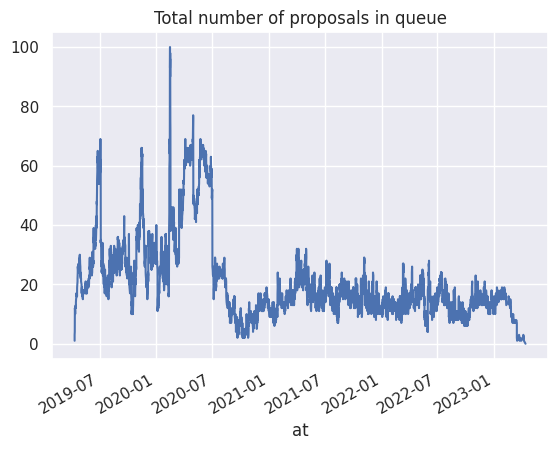

In [11]:
dfqcnt_pivot.sum(axis='columns').plot()
plt.title('Total number of proposals in queue');

Parece que hubo un atasco general en la cola de propuestas de xdai al comienzo, en marzo de 2021. Poco a poco también se ha ido saturando, probablemente porque hay propuestas que se cierran en el futuro.

Además, se ve como antes del pico en el precio de ethereum, había cierta cola en mainnet, que acaba reduciéndose al ser más costoso crear propuestas

### Tamaño de la cola en porcentaje

Vamos a ver cuantas propuestas hay en la cola, comparado con el total de propuestas

In [12]:
dfo = utils.get_df('dfo')
dfo.describe()

,delta
count,3967
mean,11 days 07:04:34.162591378
std,18 days 21:44:48.069882967
min,0 days 00:00:10
25%,5 days 00:53:12.500000
50%,6 days 04:40:25
75%,9 days 04:46:22
max,254 days 03:32:00


In [13]:
dfocnt = utils.get_df('dfocnt')
dfocnt_pivot = pd.pivot(dfocnt.groupby(['at', 'network']).sum().reset_index(), columns='network', values='cnt', index='at').sort_index().cumsum()
display(HTML('<h3>5 sample values from total open proposals:'))
dfocnt_pivot.sample(5).sort_values('at')

/tmp/ipykernel_232603/3047875489.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



network,mainnet,xdai
at,,
2019-07-24 10:02:40,26,0
2021-06-17 19:30:14,20,22
2022-06-02 16:46:50,10,24
2022-11-09 08:59:10,4,27
2023-03-04 16:18:11,8,6


In [14]:
fig = px.line(dfocnt_pivot, title='Total number of open proposals by network')
fig.add_trace(go.Scatter(x=dfqcnt_pivot.index, y=dfqcnt_pivot.mainnet, name='mainnet queue'))
fig.add_trace(go.Scatter(x=dfqcnt_pivot.index, y=dfqcnt_pivot.xdai, name='xdai queue'))

In [15]:
# Para poder dividirlos, hay que fusionar los índices y rellenar los huecos

# 1. Fusionar los índices
newdfcnt_pivot = dfocnt_pivot.merge(dfqcnt_pivot, how='outer', left_index=True, right_index=True, sort=True, suffixes=("_o", "_q"))
newdfcnt_pivot = newdfcnt_pivot.ffill()

# px.line(newdfcnt_pivot) # Check that is the same as the previous graph

# Comprobar consistencia
assert (newdfcnt_pivot.mainnet_o >= newdfcnt_pivot.mainnet_q).all(), "Number of open proposals should be greater than or equal to number of queued proposals"
assert (newdfcnt_pivot.xdai_o >= newdfcnt_pivot.xdai_q).all(), "Number of open proposals should be greater than or equal to number of queued proposals"

# Calcular porcentaje
newdfcnt_pivot['mainnet_pct'] = newdfcnt_pivot.mainnet_q / newdfcnt_pivot.mainnet_o
newdfcnt_pivot['xdai_pct'] = newdfcnt_pivot.xdai_q / newdfcnt_pivot.xdai_o

px.line(newdfcnt_pivot[['mainnet_pct', 'xdai_pct']])

### ¿Cual es el tamaño de la cola de cada DAO?

Ahora, vamos a agrupar por DAO

La idea es crear un gráfico en el que se muestre el tamaño máximo de las colas de todas las daos en cada momento, pues es en realidad el factor que definirá cuanto boosting debe haber en la red

1. Calcular el tamaño de la cola de cada DAO en cada momento (por hacer)
2. Coger el máximo tamaño de cola en cada momento (por red)

In [16]:
dfqcnt

,at,network,id,dao,daoRegister,daoName,cnt
1158,2019-04-10 18:59:04,mainnet,0x748b23205728476ea4d3e9d3a752bc1f7fdaadf660e9...,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,registered,Genesis Alpha,1
1841,2019-04-10 18:59:11,mainnet,0xb775ceea172980b5130db7eb24d07fe9713338845c1b...,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,registered,Genesis Alpha,1
2407,2019-04-10 19:01:47,mainnet,0xf038967ac6e37121f54d5d4168df9d717282d63fac3f...,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,registered,Genesis Alpha,1
2148,2019-04-11 06:42:42,mainnet,0xd709125c86ef454d72519f6ae6551fe974fa56e27489...,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,registered,Genesis Alpha,1
915,2019-04-11 06:47:10,mainnet,0x5b623c615c5713b9a1bcd41cf73687d11c37c9d7b2af...,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,registered,Genesis Alpha,1
...,...,...,...,...,...,...,...
128,2023-04-05 13:21:11,mainnet,0x0dc340bf6583557c718716d50d6fc8adbc6f73ab7414...,0x519b70055af55a007110b4ff99b0ea33071c720a,registered,dxDAO,1
2991,2023-04-05 13:25:00,xdai,0x2595e6bff6eb185088b709bd1c9a7058919ca22caed6...,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,registered,xDXdao,1
2991,2023-04-07 09:34:55,xdai,0x2595e6bff6eb185088b709bd1c9a7058919ca22caed6...,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,registered,xDXdao,-1
128,2023-04-07 15:36:11,mainnet,0x0dc340bf6583557c718716d50d6fc8adbc6f73ab7414...,0x519b70055af55a007110b4ff99b0ea33071c720a,registered,dxDAO,-1


In [17]:
# Adding things that happened at exactly the same time, and then deleting the zeroes
dfqcntsum = dfqcnt.groupby(['network', 'dao', 'at']).sum() # .groupby(level=-1)['cnt'].cumsum().reset_index()
dfqcntsum = dfqcntsum[dfqcntsum.cnt != 0]
dfqcntsum

/tmp/ipykernel_232603/3567635750.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



cnt
network dao                                        at                      
mainnet 0x0b93ba560283350d4216f29dc57e15df38d0eace 2019-08-06 22:47:40    1
                                                   2019-08-07 00:59:59   -1
                                                   2019-08-07 07:18:22    1
                                                   2019-08-07 07:32:27    1
                                                   2019-08-07 12:38:57   -1
...                                                                     ...
xdai    0xfa19f292b400579794e2e3cc0d4b6559482b9d94 2020-01-15 09:08:35    1
                                                   2020-02-05 10:34:50    1
                                                   2020-06-30 12:54:30   -4
        0xfd4a08ba1863718d92467ad05f13b352c3ae2cfd 2020-02-12 02:37:25    1
                                                   2020-02-15 15:16:25   -1

[7634 rows x 1 columns]

In [18]:
gbydao = dfqcntsum.groupby(['network', 'dao'])
dfqcntcumsum = gbydao['cnt'].cumsum().reset_index().rename(columns={'cnt': 'qsize'})
assert (dfqcntcumsum.qsize >= 0).all(), "queue size shouldn't be negative"
dfqcntcumsum

,network,dao,at,qsize
0,mainnet,0x0b93ba560283350d4216f29dc57e15df38d0eace,2019-08-06 22:47:40,1
1,mainnet,0x0b93ba560283350d4216f29dc57e15df38d0eace,2019-08-07 00:59:59,0
2,mainnet,0x0b93ba560283350d4216f29dc57e15df38d0eace,2019-08-07 07:18:22,1
3,mainnet,0x0b93ba560283350d4216f29dc57e15df38d0eace,2019-08-07 07:32:27,2
4,mainnet,0x0b93ba560283350d4216f29dc57e15df38d0eace,2019-08-07 12:38:57,1
...,...,...,...,...
7629,xdai,0xfa19f292b400579794e2e3cc0d4b6559482b9d94,2020-01-15 09:08:35,3
7630,xdai,0xfa19f292b400579794e2e3cc0d4b6559482b9d94,2020-02-05 10:34:50,4
7631,xdai,0xfa19f292b400579794e2e3cc0d4b6559482b9d94,2020-06-30 12:54:30,0
7632,xdai,0xfd4a08ba1863718d92467ad05f13b352c3ae2cfd,2020-02-12 02:37:25,1


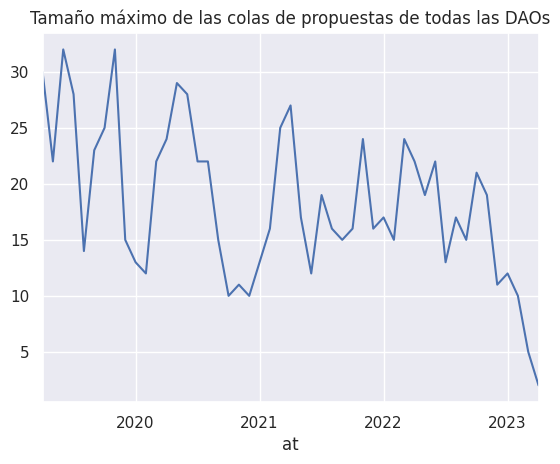

In [19]:
dfqcntcumsum.resample('1M', on='at')['qsize'].max().plot()
plt.title("Tamaño máximo de las colas de propuestas de todas las DAOs");

Max queue size is reached on apr 2020, which DAO caused it?

In [20]:
mdate = dfqcntcumsum.iloc[dfqcntcumsum.groupby(['network', 'dao'])['qsize'].idxmax().dropna()].sort_values('qsize', ascending=False)
mdate = utils.append_dao_info(mdate)
# mdate[mdate.register == 'registered'].head()
mdate.head(10)

,network,dao,at,qsize,group,name,register
0,mainnet,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,2019-06-20 10:51:01,32,Genesis Alpha,Genesis Alpha,registered
1,mainnet,0x519b70055af55a007110b4ff99b0ea33071c720a,2020-05-28 22:37:40,29,dxDAO,dxDAO,registered
2,xdai,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,2021-04-05 22:02:15,27,dxDAO,xDXdao,registered
3,mainnet,0x6bee9b81e434f7afce72a43a4016719315069539,2019-07-01 08:27:51,25,Kyber DAO Exp#2,Kyber DAO Exp#2,registered
4,mainnet,0xafdd1eb2511cd891acf2bff82dabf47e0c914d24,2020-04-06 20:32:31,24,1UP,1UP,registered
5,mainnet,0x2b8c70fffda7f3d7667f7cfede1429313886329c,2019-11-13 09:44:38,15,ETHGlobal,ETHGlobal,registered
6,mainnet,0x70c36947837b43665ed5ea85c112aa0f72cf9fb3,2019-12-05 17:55:24,15,Psychedelic Society DAO,Psychedelic Society DAO,registered
7,mainnet,0xbe1a98d3452f6da6e0984589e545d4fc25af7526,2019-12-31 21:51:33,13,dOrg,dOrg,unRegistered
8,mainnet,0xd358d4f159e6fae32d1b6096bdace829a5fe33fb,2020-02-25 23:33:59,12,dOrg,dOrg,unRegistered
9,mainnet,0x15344ecdc2c4edfcb092e284d93c20f0529fd8a6,2020-03-20 19:29:22,11,dOrg,dOrg,registered


In [21]:
print('| **Network** | **DAO** | **at** | **qsize** |')
print('|---|---|---|---|')
for i, row in mdate.head(10).iterrows():
    print('|', ' | '.join(str(x) for x in [
        row["network"].ljust(7),
        row["name"].ljust(25),
        row["at"].strftime("%b '%y"),
        row["qsize"]
    ]), '|')

| **Network** | **DAO** | **at** | **qsize** |
|---|---|---|---|
| mainnet | Genesis Alpha             | Jun '19 | 32 |
| mainnet | dxDAO                     | May '20 | 29 |
| xdai    | xDXdao                    | Apr '21 | 27 |
| mainnet | Kyber DAO Exp#2           | Jul '19 | 25 |
| mainnet | 1UP                       | Apr '20 | 24 |
| mainnet | ETHGlobal                 | Nov '19 | 15 |
| mainnet | Psychedelic Society DAO   | Dec '19 | 15 |
| mainnet | dOrg                      | Dec '19 | 13 |
| mainnet | dOrg                      | Feb '20 | 12 |
| mainnet | dOrg                      | Mar '20 | 11 |


In [22]:
TOP_DAOS = 5

_toplot = utils.append_dao_names(dfqcntcumsum[dfqcntcumsum.dao.isin(mdate.head(TOP_DAOS).dao)])
px.line(_toplot, x='at', y='qsize', color='name', title=f"Tamaño de la cola de propuestas de las DAOs (top {TOP_DAOS} colas)")

### ¿Qué son esas propuestas top?

In [23]:
# Getting DORG address
DORG_ADDR = mdate.iloc[0]['dao']
DORG_PEAK = mdate.iloc[0]['at']

# Getting dorg-made proposals in that date
dfq_dorg = dfq[
    (dfq.dao == DORG_ADDR) & # Made by dorg
    (dfq.queued <= DORG_PEAK) & (DORG_PEAK <= dfq.unqueued)
]
dfq_dorg

queued  \
network id                                                                      
mainnet 0x048ec0093f570c14540b8b81e20bb57473f867e4f18e... 2019-06-10 13:10:18   
        0x09c239082c1b1e07deb6b56c0867c8cd6219ccf4224d... 2019-04-27 19:53:25   
        0x189b53acd3022348b63d8478a140cf77bfc694fb687b... 2019-04-11 11:27:55   
        0x2153577cb7f7d0ef463f5eb836ad747787e9a56e8b6d... 2019-04-17 12:04:56   
        0x33860acb97e47b3b9767771ccbed3cd5e911bd4773a2... 2019-04-14 23:36:09   
        0x51351eda7e2aff3fe7a087598b813d406b84f80571aa... 2019-06-14 03:13:44   
        0x5661364c93105a47acf629f7c8e03a47725c257bd864... 2019-06-07 15:23:57   
        0x5834251f2eecb8a78e4d0b003092cee8ba916cbdad6e... 2019-04-20 06:21:36   
        0x5b623c615c5713b9a1bcd41cf73687d11c37c9d7b2af... 2019-04-11 06:47:10   
        0x5e74a46a2edfbe6e0ab1f2b77dd7f6f2f5dbcdf272c1... 2019-04-30 08:58:43   
        0x6181e205f83f9093e087f432349506db20e3d026985c... 2019-05-14 08:50:25   
        0x630a64fe66d31e2db354aaf852b17321ca0824436a09... 2019-06-19 11:26:12   
        0x6f0c745ec64dd67cef446df065a6f57e6d6f91de0e86... 2019-06-11 01:18:48   
        0x748b23205728476ea4d3e9d3a752bc1f7fdaadf660e9... 2019-04-10 18:59:04   
        0x76d6a5a78753aa878a1e7dd8e3aa04fa88e263d82315... 2019-05-27 22:17:27   
        0x7b7e9ef3a0f060745c5e41c6eb8fed78869a8e72e52f... 2019-06-19 16:42:20   
        0x7de54ae478be9f7b53e2cfc089324a34a24a301c7a84... 2019-06-20 00:21:25   
        0x86d2a87b3f5cc2b5abaf82fb3505225d4ea958c66855... 2019-06-11 00:07:31   
        0x9cfd6520387817f97435749197acbba72c788d646391... 2019-04-18 07:02:54   
        0xa5a20f90be29accbb2992a5046660b58fe7efa148cd5... 2019-05-26 13:47:59   
        0xab0b5ddc54203216fc72a78f64bf0a3292b2d3a998c8... 2019-05-27 22:16:03   
        0xaebc8d96eb20025fe429bdcea60edaac8febe1d6503a... 2019-04-11 11:26:36   
        0xb775ceea172980b5130db7eb24d07fe9713338845c1b... 2019-04-10 18:59:11   
        0xba24f6d23670da8829be7bbc68c99de39e210eba72f4... 2019-06-20 10:51:01   
        0xbd53f8f0e3bab9145246a94191ed7c624f04c2c0b309... 2019-06-20 08:22:52   
        0xbe96857d32b3697f70dbd13ea4cfe57876cf51f6e1af... 2019-06-20 05:50:32   
        0xbeaac61eaa55ac0090467ef77872accebecdd16bbcbe... 2019-06-19 15:26:52   
        0xcaedd83d058572249e86ef5dd749638e90cde99f1646... 2019-04-14 10:39:59   
        0xcb05848daf0190f3071f5ab2135f8a4c93b738d35b8e... 2019-06-13 12:38:29   
        0xd709125c86ef454d72519f6ae6551fe974fa56e27489... 2019-04-11 06:42:42   
        0xd71f2fd944d06e0e38582afcea4062db5eaa01604c56... 2019-06-18 09:35:24   
        0xe1be9044c206f39ff83a1b176a4588578dd328000ce2... 2019-04-26 20:07:31   

                                                                     unqueued  \
network id                                                                      
mainnet 0x048ec0093f570c14540b8b81e20bb57473f867e4f18e... 2019-06-20 11:56:07   
        0x09c239082c1b1e07deb6b56c0867c8cd6219ccf4224d... 2019-07-04 08:59:44   
        0x189b53acd3022348b63d8478a140cf77bfc694fb687b... 2019-07-04 08:57:40   
        0x2153577cb7f7d0ef463f5eb836ad747787e9a56e8b6d... 2019-07-04 08:58:07   
        0x33860acb97e47b3b9767771ccbed3cd5e911bd4773a2... 2019-06-25 18:30:43   
        0x51351eda7e2aff3fe7a087598b813d406b84f80571aa... 2019-06-21 21:45:02   
        0x5661364c93105a47acf629f7c8e03a47725c257bd864... 2019-07-07 15:24:04   
        0x5834251f2eecb8a78e4d0b003092cee8ba916cbdad6e... 2019-07-04 08:59:05   
        0x5b623c615c5713b9a1bcd41cf73687d11c37c9d7b2af... 2019-07-04 08:57:26   
        0x5e74a46a2edfbe6e0ab1f2b77dd7f6f2f5dbcdf272c1... 2019-06-26 08:52:15   
        0x6181e205f83f9093e087f432349506db20e3d026985c... 2019-07-04 09:00:03   
        0x630a64fe66d31e2db354aaf852b17321ca0824436a09... 2019-06-20 15:27:15   
        0x6f0c745ec64dd67cef446df065a6f57e6d6f91de0e86... 2019-06-26 22:08:03   
        0x748b23205728476ea4d3e9d3a752bc1f7fdaadf660e9... 2019-07-04 08:56:28   
        0x76d6a5a787

In [24]:
_COLS = ['winningOutcome', 'boostedAt', 'stakesFor', 'stakesAgainst', 'title']
dfq_dorg.join(dfp[_COLS])

queued  \
network id                                                                      
mainnet 0x048ec0093f570c14540b8b81e20bb57473f867e4f18e... 2019-06-10 13:10:18   
        0x09c239082c1b1e07deb6b56c0867c8cd6219ccf4224d... 2019-04-27 19:53:25   
        0x189b53acd3022348b63d8478a140cf77bfc694fb687b... 2019-04-11 11:27:55   
        0x2153577cb7f7d0ef463f5eb836ad747787e9a56e8b6d... 2019-04-17 12:04:56   
        0x33860acb97e47b3b9767771ccbed3cd5e911bd4773a2... 2019-04-14 23:36:09   
        0x51351eda7e2aff3fe7a087598b813d406b84f80571aa... 2019-06-14 03:13:44   
        0x5661364c93105a47acf629f7c8e03a47725c257bd864... 2019-06-07 15:23:57   
        0x5834251f2eecb8a78e4d0b003092cee8ba916cbdad6e... 2019-04-20 06:21:36   
        0x5b623c615c5713b9a1bcd41cf73687d11c37c9d7b2af... 2019-04-11 06:47:10   
        0x5e74a46a2edfbe6e0ab1f2b77dd7f6f2f5dbcdf272c1... 2019-04-30 08:58:43   
        0x6181e205f83f9093e087f432349506db20e3d026985c... 2019-05-14 08:50:25   
        0x630a64fe66d31e2db354aaf852b17321ca0824436a09... 2019-06-19 11:26:12   
        0x6f0c745ec64dd67cef446df065a6f57e6d6f91de0e86... 2019-06-11 01:18:48   
        0x748b23205728476ea4d3e9d3a752bc1f7fdaadf660e9... 2019-04-10 18:59:04   
        0x76d6a5a78753aa878a1e7dd8e3aa04fa88e263d82315... 2019-05-27 22:17:27   
        0x7b7e9ef3a0f060745c5e41c6eb8fed78869a8e72e52f... 2019-06-19 16:42:20   
        0x7de54ae478be9f7b53e2cfc089324a34a24a301c7a84... 2019-06-20 00:21:25   
        0x86d2a87b3f5cc2b5abaf82fb3505225d4ea958c66855... 2019-06-11 00:07:31   
        0x9cfd6520387817f97435749197acbba72c788d646391... 2019-04-18 07:02:54   
        0xa5a20f90be29accbb2992a5046660b58fe7efa148cd5... 2019-05-26 13:47:59   
        0xab0b5ddc54203216fc72a78f64bf0a3292b2d3a998c8... 2019-05-27 22:16:03   
        0xaebc8d96eb20025fe429bdcea60edaac8febe1d6503a... 2019-04-11 11:26:36   
        0xb775ceea172980b5130db7eb24d07fe9713338845c1b... 2019-04-10 18:59:11   
        0xba24f6d23670da8829be7bbc68c99de39e210eba72f4... 2019-06-20 10:51:01   
        0xbd53f8f0e3bab9145246a94191ed7c624f04c2c0b309... 2019-06-20 08:22:52   
        0xbe96857d32b3697f70dbd13ea4cfe57876cf51f6e1af... 2019-06-20 05:50:32   
        0xbeaac61eaa55ac0090467ef77872accebecdd16bbcbe... 2019-06-19 15:26:52   
        0xcaedd83d058572249e86ef5dd749638e90cde99f1646... 2019-04-14 10:39:59   
        0xcb05848daf0190f3071f5ab2135f8a4c93b738d35b8e... 2019-06-13 12:38:29   
        0xd709125c86ef454d72519f6ae6551fe974fa56e27489... 2019-04-11 06:42:42   
        0xd71f2fd944d06e0e38582afcea4062db5eaa01604c56... 2019-06-18 09:35:24   
        0xe1be9044c206f39ff83a1b176a4588578dd328000ce2... 2019-04-26 20:07:31   

                                                                     unqueued  \
network id                                                                      
mainnet 0x048ec0093f570c14540b8b81e20bb57473f867e4f18e... 2019-06-20 11:56:07   
        0x09c239082c1b1e07deb6b56c0867c8cd6219ccf4224d... 2019-07-04 08:59:44   
        0x189b53acd3022348b63d8478a140cf77bfc694fb687b... 2019-07-04 08:57:40   
        0x2153577cb7f7d0ef463f5eb836ad747787e9a56e8b6d... 2019-07-04 08:58:07   
        0x33860acb97e47b3b9767771ccbed3cd5e911bd4773a2... 2019-06-25 18:30:43   
        0x51351eda7e2aff3fe7a087598b813d406b84f80571aa... 2019-06-21 21:45:02   
        0x5661364c93105a47acf629f7c8e03a47725c257bd864... 2019-07-07 15:24:04   
        0x5834251f2eecb8a78e4d0b003092cee8ba916cbdad6e... 2019-07-04 08:59:05   
        0x5b623c615c5713b9a1bcd41cf73687d11c37c9d7b2af... 2019-07-04 08:57:26   
        0x5e74a46a2edfbe6e0ab1f2b77dd7f6f2f5dbcdf272c1... 2019-06-26 08:52:15   
        0x6181e205f83f9093e087f432349506db20e3d026985c... 2019-07-04 09:00:03   
        0x630a64fe66d31e2db354aaf852b17321ca0824436a09... 2019-06-20 15:27:15   
        0x6f0c745ec64dd67cef446df065a6f57e6d6f91de0e86... 2019-06-26 22:08:03   
        0x748b23205728476ea4d3e9d3a752bc1f7fdaadf660e9... 2019-07-04 08:56:28   
        0x76d6a5a787

In [25]:
"""
from dao_analyzer.cache_scripts.common import ENDPOINTS
from dao_analyzer.cache_scripts.common.api_requester import GQLRequester

requester = GQLRequester(ENDPOINTS['mainnet']['daostack'])
ds = requester.get_schema()

def get_title_description(row: pd.Series):
    assert row.name[0] == 'mainnet', 'Only mainnet is supported'
    
    result = requester.request(
        ds.Query.proposal(id=row.name[1]).select(
            # ds.Proposal.id,
            ds.Proposal.title,
            ds.Proposal.description,
        )
    )
    
    assert result is not None, "None result returned"
    
    return pd.concat([row, pd.Series(result['proposal'])])
"""

# dfdorg7p = dfq_dorg.progress_apply(get_title_description, axis=1)
# dfdorg7p

'\nfrom dao_analyzer.cache_scripts.common import ENDPOINTS\nfrom dao_analyzer.cache_scripts.common.api_requester import GQLRequester\n\nrequester = GQLRequester(ENDPOINTS[\'mainnet\'][\'daostack\'])\nds = requester.get_schema()\n\ndef get_title_description(row: pd.Series):\n    assert row.name[0] == \'mainnet\', \'Only mainnet is supported\'\n    \n    result = requester.request(\n        ds.Query.proposal(id=row.name[1]).select(\n            # ds.Proposal.id,\n            ds.Proposal.title,\n            ds.Proposal.description,\n        )\n    )\n    \n    assert result is not None, "None result returned"\n    \n    return pd.concat([row, pd.Series(result[\'proposal\'])])\n'

Parece ser que no tenemos el título de las propuestas, tan solo un enlace a una hoja de cálculo que a día de hoy da Error 500

In [26]:
# dfp.merge(dfdorg7p, left_index=True, right_index=True).drop(columns=['competitionId', 'closingAt', 'dao_x', 'preBoostedAt', 'preBoostedClosingAt', 'daoRegister_x', 'network_x', 'network_y'])

# Análisis de la atención

## 1. Hacer el rolling

La pregunta que queremos resolver es: ¿cuantas propuestas se han abierto en los últimos _WINDOW\_SIZE_ días?

In [27]:
WINDOW_SIZE = '30d'

# Eliminamos momentos repetidos
_df = dfqcnt.groupby(['network', 'at']).sum()

# Hacemos la suma en rolling window
_df = _df.groupby(level='network').apply(lambda x: x.reset_index(level='network', drop=True).rolling(WINDOW_SIZE).sum())

# Lo mostramos en pantalla
px.line(_df.reset_index(level='network'), color='network', title='Variación en el tamaño de la cola a lo largo del tiempo')

/tmp/ipykernel_232603/1544598514.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [28]:
WINDOW_SIZE = '30d'

_df = dfqcnt
# Cuando se elimina una propuesta, lo ponemos a cero para que no cuente al hacer la suma
_df.cnt = _df.cnt.apply(lambda x: x * (x > 0))

# Combinamos los momentos repetidos
_df = _df.groupby(['network', 'at']).sum()

# Hacemos la suma en rolling window
_df = _df.groupby(level='network').apply(lambda x: x.reset_index(level='network', drop=True).rolling(WINDOW_SIZE).sum())

dfprolling = _df.reset_index(level='network')

# Lo mostramos en pantalla
px.line(dfprolling, color='network', line_shape='hv', title=f'Propuestas creadas en los últimos {WINDOW_SIZE}')

/tmp/ipykernel_232603/686239784.py:8: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [29]:
WINDOW_SIZE = 15 # días

# IDX_COL = 'daoName'
IDX_COL = 'group'

_df: pd.DataFrame = utils.append_dao_info(dfqcnt)
# Cuando se elimina una propuesta, lo ponemos a cero para que no cuente al hacer la suma
# relu = lambda x: max(0,x)
# _df.cnt = _df.cnt.apply(relu)
_df = _df[_df.cnt > 0] # No afectan a la suma

# Añadimos un montón de "puntos virtuales" a cero, WINDOW_SIZE días después, para forzar el recálculo de la ventana
_off = _df.copy()
_off['cnt'] = 0
_off['at'] += pd.DateOffset(days=WINDOW_SIZE)
_df = pd.concat([_df, _off])

# Combinamos los puntos comunes
_df = _df.groupby(['at', IDX_COL]).sum(numeric_only=True)
# Y hacemos el rolling por cada dao
_df = _df.groupby(level=IDX_COL).apply(lambda x: x.reset_index(level=IDX_COL, drop=True).rolling(f'{WINDOW_SIZE}d')['cnt'].sum())

_df = _df.sort_index()

dfprolling_dao = _df
px.line(_df.reset_index(level=IDX_COL), color=IDX_COL, line_shape='hv', title=f'Propuestas creadas en los últimos {WINDOW_SIZE} días por DAO')

{'_child0': (0.00392156862745098, 0.45098039215686275, 0.6980392156862745), '_child2': (0.8705882352941177, 0.5607843137254902, 0.0196078431372549), '_child4': (0.00784313725490196, 0.6196078431372549, 0.45098039215686275), '_child6': (0.8352941176470589, 0.3686274509803922, 0.0), 'dxDAO': (0.00392156862745098, 0.45098039215686275, 0.6980392156862745), 'dOrg': (0.8705882352941177, 0.5607843137254902, 0.0196078431372549), 'Genesis Alpha': (0.00784313725490196, 0.6196078431372549, 0.45098039215686275), 'Kyber DAO Exp#2': (0.8352941176470589, 0.3686274509803922, 0.0)}
saving to ../logseq/assets/nb_figures/queue/queue_size_top_daos.png
Figure is Axes
Use ![Queue size of top 4 orgs](../assets/nb_figures/queue/queue_size_top_daos.png) to embed it in logseq


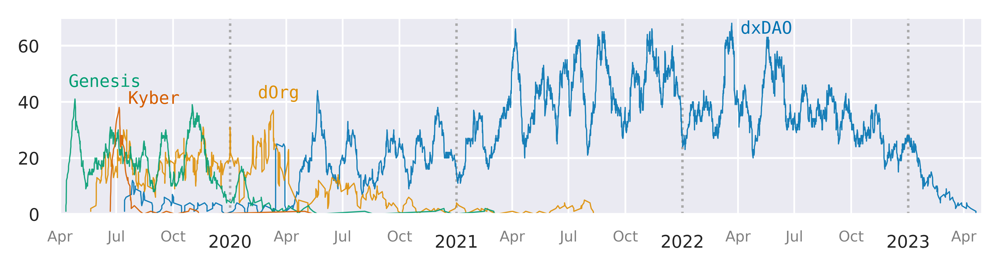

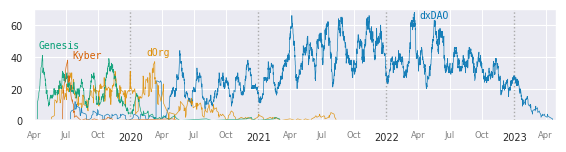

In [95]:
import matplotlib.dates as mdates

sns.set_context('paper')
plt.rcParams['xtick.labelsize'] = plt.rcParams['ytick.labelsize'] = 7

MIN_SIZE = 31 # Minimum number of proposals
YLIM = 70

_df = dfprolling_dao.copy().reset_index()
_max_per_dao = _df.groupby('group')['cnt'].max()
_daos = _max_per_dao[_max_per_dao >= MIN_SIZE].index
_df_daos = _df[_df['group'].isin(_daos)]

# _hue_order = list(_df_daos.sort_values('at')['group'].drop_duplicates())[::-1]
# print(_hue_order)
_hue_order = [
    'dxDAO', 
    'dOrg', 
    'Genesis Alpha',
    'Kyber DAO Exp#2', 
]

# TODO: Filter DAOs by number of proposals in peak
# TODO: Plot only filtered DAOs using seaborn
plt.figure(figsize=(5.75,1.8))
fig = sns.lineplot(_df_daos, x='at', y='cnt', hue='group', alpha=0.9, linewidth=0.5, hue_order=_hue_order, palette='colorblind')
fig.set_title(f'Queue size of top {len(_daos)} orgs')
# Remove legend
fig.get_legend().set_visible(False)

# Apr'19, Jul'19...Apr' 23
fig.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
fig.xaxis.set_minor_formatter(mdates.DateFormatter("%b"))
# fig.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[1,4,7,10], bymonthday=1))
fig.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=[1,4,7,10], bymonthday=1))
fig.xaxis.set_major_locator(mdates.YearLocator(month=1, day=1))
fig.tick_params(axis='x', which='minor', labelcolor='gray', labelsize=6)

fig.grid(True, which='major', axis='x', linestyle=':', linewidth=1, color='darkgrey')
fig.grid(True, which='minor', axis='x', linestyle='-', linewidth=0.7, color='white')

# Remove labels
fig.set_xlabel('')
fig.set_ylabel('')
# plt.gcf().autofmt_xdate()
fig.set_xlim((pd.Timestamp('2019-04-01'), pd.Timestamp('2023-05-01')))
fig.set_ylim((0, YLIM))

# Now, to show the DAO names
override_point_dict = {
    # 'dxDAO': ('2020-05-15', 45),
    'dxDAO': ('2022-04-5', 63),
    'Genesis Alpha': ('2019-04-15', 44),
    'Kyber DAO Exp#2': ('2019-07-20', 38),
    'dOrg': ('2020-02-15', 40),
}
override_dao_name_dict = {
    'Genesis Alpha': 'Genesis',
    'Kyber DAO Exp#2': 'Kyber',
}
color_dict = {l.get_label():l.get_color() for l in fig.get_lines()}
print(color_dict)
for d in _daos:
    if d in override_point_dict:
        at, cnt = override_point_dict[d]
    else:
        _df_dao = _df_daos[_df_daos['group'] == d]
        
        _idxmax = _df_dao['cnt'].idxmax()
        at = _df_dao.at[_idxmax, 'at'] - pd.Timedelta(days=5)
        cnt = _df_dao.at[_idxmax, 'cnt']+ 0.5
        print(f"Using point ({at},{cnt}) for {d}")
        
    fig.text(
        pd.Timestamp(at), 
        cnt, 
        override_dao_name_dict.get(d, d),
        horizontalalignment='left',
        verticalalignment='bottom', 
        fontsize=7,
        family='monospace',
        # weight='bold',
        color=color_dict[d],
    )

plt.tight_layout()
utils.save_fig(fig, 'queue/queue_size_top_daos.png')
for ext in ['png', 'svg', 'pdf']:
    plt.savefig('../logseq/assets/nb_figures/queue/queue_size_top_daos_final.'+ext, bbox_inches='tight', dpi=1200)
Image('../logseq/assets/nb_figures/queue/queue_size_top_daos_final.png')

## Cual es el pico máximo de cada DAO?

In [ ]:
max_dao_peak = dfprolling_dao.groupby(IDX_COL).max()
max_dao_peak.sort_values(ascending=False).head(10)

group
dxDAO                      68.0
Genesis Alpha              41.0
Kyber DAO Exp#2            38.0
dOrg                       37.0
1UP                        30.0
DAOfund                    28.0
BuffiDAO                   24.0
PolkaDAO                   21.0
ETHGlobal                  18.0
Psychedelic Society DAO    16.0
Name: cnt, dtype: float64

## Cuantas DAOs han tenido algún pico de más de 20 propuestas

In [ ]:
WINDOW_SIZE = 15
PROP_SIZE = 15
idxDAOs = dfprolling_dao[dfprolling_dao > PROP_SIZE].index.get_level_values(IDX_COL).unique()

print(f"Las únicas {len(idxDAOs)} DAOs con pico son: {', '.join(idxDAOs)}")

px.line(dfprolling_dao[idxDAOs].reset_index(level=IDX_COL), color=IDX_COL, line_shape='hv', title=f'Propuestas creadas en los últimos {WINDOW_SIZE} días por DAO en DAOs con más de {PROP_SIZE} propuestas')

Las únicas 10 DAOs con pico son: 1UP, BuffiDAO, DAOfund, ETHGlobal, Genesis Alpha, Kyber DAO Exp#2, PolkaDAO, Psychedelic Society DAO, dOrg, dxDAO


## 2. Calcular los picos

In [ ]:
def ffill_until_valid(series: pd.Series):
    return series.loc[:series.last_valid_index()].ffill()

In [ ]:
dfprolling_1d = dfprolling.groupby('network').resample('1D')['cnt'].last().ffill()
dfprolling_1d_unstack = dfprolling_1d.unstack(level='network')

@widgets.interact(min_height=(0, 150), distance=(1, 90))
def plot_signal(min_height=15, distance=20):
    lines = px.line(dfprolling_1d_unstack)
    figpeaks = []
    for n in dfprolling_1d_unstack.columns:
        peaks, _ = scipy.signal.find_peaks(dfprolling_1d_unstack[n], height=min_height, distance=distance)
        print(f"There are {len(peaks)} peaks in {n}")

        figpeaks.append(px.scatter(dfprolling_1d_unstack[n].iloc[peaks]))
        figpeaks[-1].update_traces(marker={'color':'black'})

    return go.Figure(figpeaks[0].data + figpeaks[1].data + lines.data) # tuple([p.data for p in figpeaks]))

interactive(children=(IntSlider(value=15, description='min_height', max=150), IntSlider(value=20, description=…

### Ahora para cada DAO

Para calcular los picos uso la función `find_peaks` de la librería `scipy.signal`. Los únicos dos parámetros que modifico (disponibles en los sliders) son:
- **min_height**: La altura mínima de los picos -> Número mínimo de propuestas abiertas para considerarlo un pico
- **distance**: La distancia mínima entre picos -> Número de días que deben pasar entre picos
- **width**: El ancho de los picos -> Número de días que deben pasar sin que el pico vuelva a subir

In [ ]:
def _aux_idxmax(s: pd.Series) -> pd.Series:
    ret = {
        'idxmax': np.NaN,
        'max': np.NaN,
    }
    
    if not s.empty:
        ret['idxmax'] = s['cnt'].idxmax()
        ret['max'] = s['cnt'][ret['idxmax']]
    
    return pd.Series(ret)

# _df = dfprolling_dao.groupby('daoName').apply(lambda x: x.reset_index(level='daoName', drop=True).resample('1D')['cnt'].apply(lambda s: s.idxmax() if not s.empty else np.NaN)) # last?
_df = dfprolling_dao.groupby('daoName').apply(lambda x: x.reset_index(level='daoName', drop=True).resample('1D').apply(_aux_idxmax))
_df_unstack = _df.unstack(level='daoName').apply(ffill_until_valid)

dfpeaks = pd.DataFrame()
@widgets.interact(min_height=(0, 50), distance=(1,90), width=(0, 5))
# def plot_signal(min_height = 5, distance = WINDOW_SIZE, width=1):
def plot_signal(min_height = 10, distance = WINDOW_SIZE, width=2):
    global dfpeaks
    
    allpeaks = []
    figpeaks = []
    
    for d in _df_unstack['max'].columns:
        peaks, _ = scipy.signal.find_peaks(_df_unstack['max'][d], height=min_height, distance=distance, width=width)
        
        # FIXME: Metemos la **fecha** del pico, no el momento (datetime), lo cual nos dará problemas más tarde
        # sobreestimando el número de daos. La solución sería, para cada pico, comprobar cual ha sido el momento
        # en el que se ha llegado al max de ese día
        # auxPeaksdf = _df_unstack['idxmax'][d].iloc[peaks].to_frame(name='peak')
        if d == 'dxDAO':
            print(peaks)
        auxPeaksdf = pd.DataFrame({
            'daoName': d,
            'peak': _df_unstack['idxmax'][d].iloc[peaks],
            'cnt': _df_unstack['max'][d].iloc[peaks],
        })
        allpeaks.append(auxPeaksdf)
            
        figpeaks.append(px.scatter(_df_unstack['max'][d].iloc[peaks]))
        figpeaks[-1].update_traces(marker={'color':'black'})
        
    dfpeaks = pd.concat(allpeaks, axis='rows')

    print(f"Hay un total de {len(dfpeaks)} picos")
    
    lines = px.line(_df_unstack['max'], line_shape='hv', title=f"Propuestas creadas en los últimos {WINDOW_SIZE} días por cada DAO. Picos mh={min_height}, d={distance}, w={width}")
    
    # accdata = foldl (+) lines.data $ map (\f -> f.data) figpeaks
    accdata = lines.data
    [accdata := accdata + f.data for f in figpeaks]
    
    return go.Figure(accdata, layout=lines.layout)

KeyError: 'daoName'

## 3. Obtener todas las propuestas que forman parte de los picos

Teniendo el `at` y el nombre de la DAO, "tan solo" tenemos que unirlo con el df de las propuestas

- Hay que obtener, para cada dao, todas las propuestas que se abrieron en el intervalo $(at-w, at)$, donde $w$ es el tamaño de la ventana
- Además, añadimos el campo cntopen a dfp, por si puede sernos útil

In [ ]:
len(utils.get_df('dfp'))

In [ ]:
print("La suma de cnt es", dfpeaks['cnt'].sum())
dfpeaks

In [ ]:
assert dfpeaks['cnt'].sum() <= len(utils.get_df('dfp')), "No puede haber más propuestas en picos que propuestas"

In [ ]:
dfpeaks.groupby('daoName')['peak'].count().plot.bar(title='Número de picos en cada DAO');

In [ ]:
from datetime import timedelta

print("Using window_size:", timedelta(days=WINDOW_SIZE))

def peakdt(prop: pd.Series, w: timedelta = timedelta(days=WINDOW_SIZE)) -> bool:
    """ Given a proposal, checks if the proposal was created during a peak and returns the time (idx) of the peak """
    daoPeaks = dfpeaks[dfpeaks['daoName'] == prop['name']]
    daoPeaksDates = pd.to_datetime(daoPeaks.index)
    
    # When comparing data with datetime
    c1 = daoPeaks['peak'] - w <= prop['createdAt']
    c2 = prop['createdAt'] <= daoPeaks['peak']
    return daoPeaks[ c1 & c2 ].first_valid_index()

dfp['peak'] = dfp.apply(peakdt, axis='columns')
dfp['isInPeak'] = ~dfp['peak'].isna()
print(f"Hay un total de {dfp.isInPeak.sum()} propuestas abiertas durante un pico ({dfp.isInPeak.mean()*100:.2f}%)")
sns.countplot(dfp[dfp.name.isin(dfpeaks.daoName)].sort_values('name'), x='name', hue='isInPeak') \
    .set_title('Número de propuestas abiertas durante un pico')
plt.xticks(rotation=90);

Vamos a intentar verificar de alguna manera que está todo bien.

La idea es plottear la serie temporal del número de propuestas con isInPeak=True por cada dao

In [ ]:
_dfp = dfp.copy()
_dfp = _dfp[_dfp.isInPeak]
_toplot = _dfp.groupby(['peak', 'name']).size().reset_index(name='count')

px.line(
    _toplot,
    x='peak',
    y='count',
    color='name',
    title="Propuestas creadas durante un pico",
    markers=True,
)

<span style='color: red; font-size: 2em;'>WARNING:</span> Antes de calcular los picos hacemos un resample día a día, por lo que al recuperar las propuestas que ocurrieron en un pico **se nos colarán unas cuantas más que ocurrieron el mismo día**. Para arreglarlo, deberíamos o bien calcular los picos con mayor precisión (segundo a segundo) o, una vez calculados los picos, repasar el rolling window para ver en qué momento del día se produjo ese pico (cuando se dio el max).

> Aunque bueno, tener un "error" de unas pocas horas no es tan relevante porque estamos tratando con "sociología" y "pico" es un término muy difuso que hemos creado

## 4. Obtener estadísticas de los picos

In [ ]:
###### COPIADO DE boosting_predictor.ipynb ######

# Esto es igual a poner ~dfp.executedAt.isna()
dfpr = dfp[dfp.stage.isin([
    "Executed",        # Ha sido ejecutada, puede ser aprobada o no, boosteada o no
    "ExpiredInQueue",  # Tras mucho tiempo en la cola, no ha conseguido ni mayoría absoluta ni ser boosteada
])]

print("Total:", len(dfpr), "propuestas")

# Eliminar "competition" (se hace voto entre varias opciones, no tienen por qué ser Sí y No)
dfpr = dfpr[ dfpr['competitionId'].isnull() ].copy() #.reset_index(level='network', drop=True)

print("There are", (dfpr['stakesFor'] == dfpr['stakesAgainst']).sum(), "ties")

dfpr['stakes'] = dfpr['stakesFor'] > dfpr['stakesAgainst']
dfpr['boosted'] = ~dfpr['boostedAt'].isnull()
dfpr['approved'] = dfpr['winningOutcome'] == 'Pass'
dfpr['votingRel'] = dfpr['votesFor'] > dfpr['votesAgainst']

dfpr['votesForPct'] = dfpr['votesFor'].astype(float) / dfpr['totalRepWhenCreated'].astype(float)
dfpr['votesAgainstPct'] = dfpr['votesAgainst'].astype(float) / dfpr['totalRepWhenCreated'].astype(float)
dfpr['votesAbstainPct'] = 1 - dfpr['votesForPct'] - dfpr['votesAgainstPct']
dfpr['votingAbs'] = dfpr['votesForPct'] > 0.5

dfpr[['approved', 'stakes', 'boosted']].value_counts()

In [ ]:
print("Recuerda, las columnas nuevas de dfpr son: ", dfpr.columns.difference(dfp.columns))

### boosting rate - ¿se hace más o menos boosting durante los picos?

In [ ]:
dfpr.columns

In [ ]:
_melt = dfpr[['stakesFor', 'stakesAgainst', 'isInPeak']].melt(value_vars=['stakesFor', 'stakesAgainst'], value_name='stakes', id_vars='isInPeak')
sns.barplot(_melt, x='variable', y='stakes', hue='isInPeak').set_title('Cantidad stakeada a favor y en contra');

In [ ]:
sns.countplot(dfpr[['isInPeak', 'boosted']], x='isInPeak', hue='boosted').set_title('Número de propuestas boosteadas');

Hay algo más de staking tanto a favor como en contra en las propuestas que forman parte de una cola, pero no hay una gran diferencia.

In [ ]:
px.bar(dfpr.groupby('isInPeak')['boosted'].mean(), title='Porcentaje de propuestas boosteadas')

Aunque se stakea un poco más durante los picos, el porcentaje de propuestas boosteadas es ligeramente menor (de 78% a 73%), pues aumenta la cantidad necesaria a stakear para que una propuesta sea boosteada.

### staking - ¿Suele ser interno o externo?

In [ ]:
dfs = utils.get_df('dfs')

# display(dfpr.drop(columns=['boostedAt', 'closingAt', 'competitionId', 'createdAt', 'votesAgainst', 'executedAtMonth', 'daoRegister']))
dfprs = dfpr.copy()

dfprs['internalDAO'] = dfs[dfs['internalDAO']].groupby('proposal')['amount'].sum()
dfprs['internalPlatform'] = dfs[dfs['internalPlatform'] & ~dfs['internalDAO']].groupby('proposal')['amount'].sum()
dfprs['internalDAO'].fillna(0, inplace=True)
dfprs['internalPlatform'].fillna(0, inplace=True)

px.bar(dfprs.groupby(['isInPeak']).sum(), y=['internalDAO', 'internalPlatform'], title='Cantidad total stakeada fuera y dentro de un pico')

In [ ]:
px.bar(dfprs.groupby(['isInPeak']).mean(), y=['internalDAO', 'internalPlatform'])

Parece que sí que se hace un poco más de staking cuando hay un pico en la cola, y en porcentaje menor parte de este staking es de fuera de la DAO.

### predictor - ¿se predice mejor durante los picos?

In [ ]:
##### COPIADO DE boosting_predictor.ipynb #####

def plot_classification_report_2x2(df, suptitle='Classification report'):
    NETWORKS = ['mainnet', 'xdai']
    
    fig, axs = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True, tight_layout=True)
    
    fig.suptitle(suptitle)
    fig.supxlabel("isInPeak")
    fig.supylabel("Network")
    
    print("y_true = approved, y_pred = boosted")
    print(classification_report(y_true=df['approved'], y_pred=df['boosted'], zero_division=0))
    for i, n in enumerate(NETWORKS):
        dfprn = df[df['network'] == n]
        print(f"## {n} only ##")
        print(classification_report(y_true=dfprn['approved'], y_pred=dfprn['boosted'], zero_division=0))
        for j, p in enumerate([False, True]):
            dfprnp = dfprn[dfprn['isInPeak'] == p]
            ct = pd.crosstab(dfprnp['approved'], dfprnp['boosted'])
            if True not in ct.columns:
                ct[True] = 0
                
            ct = ct.sort_index(ascending=False).sort_index(axis=1, ascending=False)
                
            sns.heatmap(ct, annot=True, fmt='d', ax=axs[i][j], cmap=utils.plot.default_heatmap_cmap)

            # Hide labels on the middle
            t = "Inside peak" if p else "Outside peak"
            axs[i][j].set_xlabel(f"{axs[i][j].get_xlabel()}\n{t}" if i != 0 else '')
            axs[i][j].set_ylabel(f"{n}\n{axs[i][j].get_ylabel()}" if j == 0 else '')
            
    plt.close()
    return fig

utils.plot.save_fig(plot_classification_report_2x2(dfpr.reset_index(), suptitle="Classification report in peaks"), 'queue/classification_report_peaks.png')

Parece ser que durante los picos la precisión es mucho peor, seguramente por el alto umbral de boosting sea más dificil que la propuesta sea boosteada... Pero aun así existe la necesidad de votar y la gente vota.

Sin embargo, también es verdad que las propuestas no-boosteadas tardan mucho más, y por lo tanto es más probable que coincidan con un pico...

### voting - ¿Se aprueban más propuestas durante los picos?

In [ ]:
sns.countplot(dfpr[['approved', 'isInPeak']], x='approved', hue='isInPeak').set_title('Número de propuestas aprobadas');

In [ ]:
dfpr.groupby('isInPeak')['approved'].mean().plot.bar(title='Porcentaje de propuestas aprobadas');

Está muy igualado, parece que pertenecer o no a una cola no afecta a si la propuesta será o no aprobada

### voting - ¿cual es la abstención media durante los picos?

In [ ]:
sns.barplot(dfpr.melt(id_vars=['isInPeak'], value_vars=['votesAbstainPct']), x='variable', y='value', hue='isInPeak')

Parece que durante los picos baja un poco la abstención. Puede que sea porque durante los picos aumenta la participación en general (y por eso se producen picos), aunque creo que disminuye demasiado poco.

### voting - ¿cuantas propuestas salen por mayoría absoluta en los picos?

In [ ]:
dfpr.groupby('isInPeak')['votingAbs'].mean().plot.bar(title='Porcentaje de propuestas aprobadas por mayoría absoluta');

Curiosamente, hay el doble de propuestas aprobadas por mayoría absoluta cuando hay picos en la cola. Esto puede ser debido a que la cantidad necesaria para boostear una propuesta aumenta considerablemente.